# Package installation

In [ ]:
!pip install "jax==0.7.2" "jaxlib==0.7.2" "diffrax==0.7.0" "equinox" "optax"


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
from jax import jit
import functools
from time import time

jax.config.update("jax_enable_x64", True)

# ---------- Colab-friendly import of shared Dynamics/Training modules ----------
import os, sys

REPO_URL = "https://github.com/YanchengDu/LiquidCHL.git"
REPO_DIR = "LiquidCHL"

if os.path.isdir("Dynamics") and os.path.isdir("Training"):
    repo_root = "."
elif os.path.isdir(os.path.join("..", "Dynamics")):
    repo_root = ".."
else:
    if not os.path.isdir(REPO_DIR):
        !git clone {REPO_URL} {REPO_DIR}
    repo_root = REPO_DIR

if repo_root not in sys.path:
    sys.path.insert(0, repo_root)

from Dynamics.Spatial_Cahn_Hilliard import (
    simplex_project_np, simplex_project_jax,
    init_phi_multi_jax,
    fprime_multi_jax,
    compute_energy_spectral_jax, compute_energy_map_jax,
    step_jax,
    run_cahn_hilliard_multi_FH_rstab_jax_until_converged,
    partition_memory, hebbian_learning_matrix,
    valid_vectors, generate_vectors, generate_memories,
    identify_memories,
    plot_energy, plot_final_components, plot_memories_grayscale,
)


In [ ]:
from Training.contrastive_hebbian_learning_spatial import (
    train_contrastive_hebbian_newscheme,
)


# Training again

Partitioned memories:
Memory 1: [0.05504982 0.00745018 0.00745018 0.00745018 0.00745018 0.00745018
 0.05504982 0.05504982 0.00745018 0.00745018 0.05504982 0.00745018
 0.05504982 0.05504982 0.00745018 0.05504982 0.00745018 0.05504982
 0.00745018 0.00745018 0.00745018 0.00745018 0.05504982 0.05504982
 0.05504982 0.05504982 0.00745018 0.05504982 0.00745018 0.05504982
 0.05504982 0.05504982]
Memory 2: [0.05504982 0.00745018 0.00745018 0.00745018 0.05504982 0.00745018
 0.00745018 0.00745018 0.05504982 0.00745018 0.05504982 0.00745018
 0.05504982 0.00745018 0.00745018 0.05504982 0.05504982 0.05504982
 0.00745018 0.00745018 0.05504982 0.05504982 0.00745018 0.05504982
 0.05504982 0.00745018 0.05504982 0.00745018 0.00745018 0.05504982
 0.05504982 0.05504982]
Memory 3: [0.00745018 0.05504982 0.05504982 0.05504982 0.05504982 0.05504982
 0.00745018 0.00745018 0.00745018 0.05504982 0.05504982 0.00745018
 0.00745018 0.05504982 0.00745018 0.05504982 0.00745018 0.05504982
 0.05504982 0.00745018 0.0550

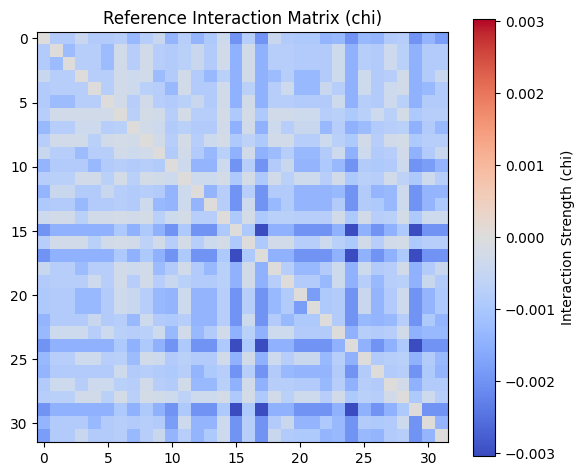

In [2]:
N = 32
target_memories = ([[1.,0.,0.,0.,0.,0.,1.,1.,0.,0.,1.,0.,1.,1.,0.,1.,0.,1.,0.,0.,0.,0.,1.,1.,1.,1.,0.,1.,0.,1.,1.,1.],
 [1.,0.,0.,0.,1.,0.,0.,0.,1.,0.,1.,0.,1.,0.,0.,1.,1.,1.,0.,0.,1.,1.,0.,1.,1.,0.,1.,0.,0.,1.,1.,1.],
 [0.,1.,1.,1.,1.,1.,0.,0.,0.,1.,1.,0.,0.,1.,0.,1.,0.,1.,1.,0.,1.,1.,0.,0.,1.,0.,0.,0.,0.,1.,1.,0.],
 [0.,0.,0.,1.,0.,0.,0.,0.,0.,1.,0.,0.,1.,1.,1.,1.,0.,1.,1.,1.,1.,1.,1.,0.,1.,0.,1.,1.,0.,1.,0.,0.],
 [1.,1.,1.,0.,0.,1.,0.,1.,0.,0.,0.,1.,0.,0.,0.,1.,0.,1.,0.,1.,0.,0.,1.,0.,1.,1.,1.,0.,1.,1.,0.,1.]])
partitioned_memories = []
beta = 0.5
for memory in target_memories:
    partitioned_memories.append(partition_memory(memory, beta))
print("Partitioned memories:")
for idx, p_memory in enumerate(partitioned_memories):
    print(f"Memory {idx+1}: {p_memory}")
# Generate initial condition
memory_ratio = [1.0/len(partitioned_memories) for _ in range(len(partitioned_memories))]
mean_phi = np.mean(target_memories)
chi_ref = []
chi_ref.append(hebbian_learning_matrix(partitioned_memories, memory_ratio))
# Plot the reference chi matrix
plt.figure(figsize=(6, 5))
plt.imshow(chi_ref[0], cmap='coolwarm', vmin=-np.max(np.abs(chi_ref[0])), vmax=np.max(np.abs(chi_ref[0])))
plt.colorbar(label='Interaction Strength (chi)')
plt.title('Reference Interaction Matrix (chi)')
plt.tight_layout()
plt.show()

Training:   0%|          | 0/10 [00:00<?, ?it/s]

()
pos: 0
Energy slope converged.
Final rel_change: 4.790e-03
Max slope over window: 4.994e-08
Average energy slope over last 5 entries: 0.000e+00
Accepted steps: 32319, Rejected steps: 2271, Final time: 447.499390
chi_trained [[ 0.         -0.00086328 -0.00086328 ... -0.00198234 -0.00138735
  -0.00184049]
 [-0.00086328  0.         -0.0012455  ... -0.00145827 -0.00086328
  -0.00086328]
 [-0.00086328 -0.0012455   0.         ... -0.00145827 -0.00086328
  -0.00086328]
 ...
 [-0.00198234 -0.00145827 -0.00145827 ...  0.         -0.00198234
  -0.00198234]
 [-0.00138735 -0.00086328 -0.00086328 ... -0.00198234  0.
  -0.00138735]
 [-0.00184049 -0.00086328 -0.00086328 ... -0.00198234 -0.00138735
   0.        ]]
Epoch 1/10, ΔF = 0.000153


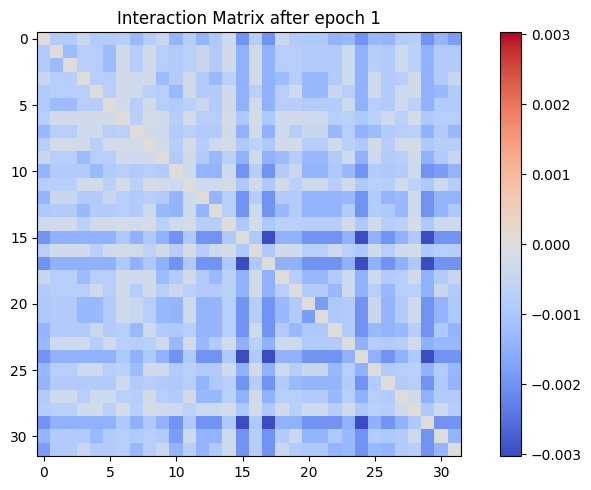

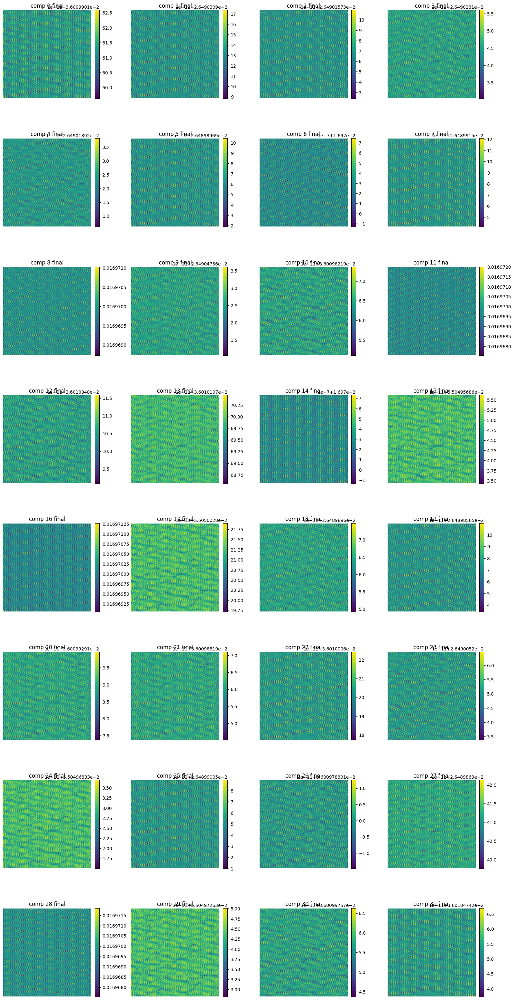

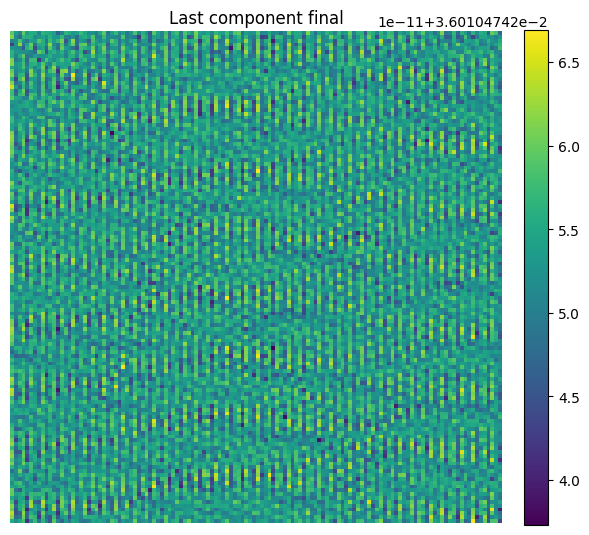

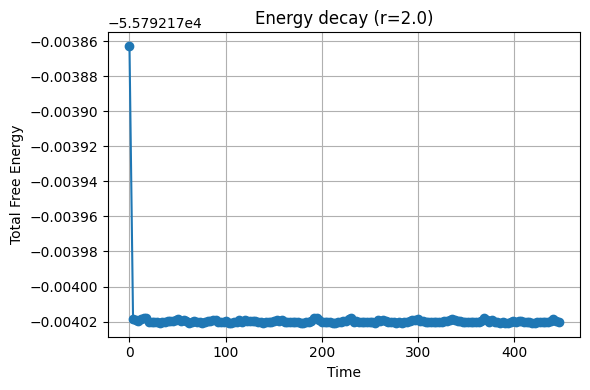

Training:  10%|█         | 1/10 [04:09<37:23, 249.30s/it]

()
pos: 0
Maximum time limit reached.
Accepted steps: 37005, Rejected steps: 2601, Final time: 500.003427


Training:  20%|██        | 2/10 [08:47<35:29, 266.24s/it]

()
pos: 0


Training:  30%|███       | 3/10 [11:07<24:20, 208.63s/it]

Energy slope converged.
Final rel_change: 4.588e-03
Max slope over window: 4.983e-08
Average energy slope over last 5 entries: 0.000e+00
Accepted steps: 18707, Rejected steps: 1313, Final time: 247.294230
()
pos: 0
Maximum time limit reached.
Accepted steps: 38798, Rejected steps: 2727, Final time: 500.004013


Training:  40%|████      | 4/10 [15:57<24:05, 240.89s/it]

()
pos: 0
Maximum time limit reached.
Accepted steps: 39714, Rejected steps: 2792, Final time: 500.002155


Training:  50%|█████     | 5/10 [20:55<21:46, 261.28s/it]

()
pos: 0
Maximum accepted-step limit reached.
Accepted steps: 200000, Rejected steps: 14079, Final time: 120.038226


Training:  60%|██████    | 6/10 [46:01<45:38, 684.61s/it]

()
pos: 0
Maximum accepted-step limit reached.
Accepted steps: 200000, Rejected steps: 14078, Final time: 145.108050


Training:  70%|███████   | 7/10 [1:11:00<47:32, 950.95s/it]

()
pos: 0
Maximum accepted-step limit reached.
Accepted steps: 200000, Rejected steps: 14082, Final time: 23.388834


Training:  80%|████████  | 8/10 [1:36:00<37:31, 1125.62s/it]

()
pos: 0
Maximum accepted-step limit reached.
Accepted steps: 200000, Rejected steps: 14082, Final time: 38.425698


Training:  90%|█████████ | 9/10 [2:01:04<20:44, 1244.02s/it]

()
pos: 0
Maximum accepted-step limit reached.
Accepted steps: 200000, Rejected steps: 14082, Final time: 59.943595
chi_trained [[ 0.          0.92546554  0.9254154  ...  0.03912431 -0.79217749
  -4.97406875]
 [ 0.92546554  0.         -6.32281995 ... -0.23539533 -0.32986603
   0.92543839]
 [ 0.9254154  -6.32281995  0.         ... -0.23547045 -0.32991636
   0.92538826]
 ...
 [ 0.03912431 -0.23539533 -0.23547045 ...  0.         -0.1286392
   0.03906262]
 [-0.79217749 -0.32986603 -0.32991636 ... -0.1286392   0.
  -0.79222267]
 [-4.97406875  0.92543839  0.92538826 ...  0.03906262 -0.79222267
   0.        ]]
Epoch 10/10, ΔF = 373.325925


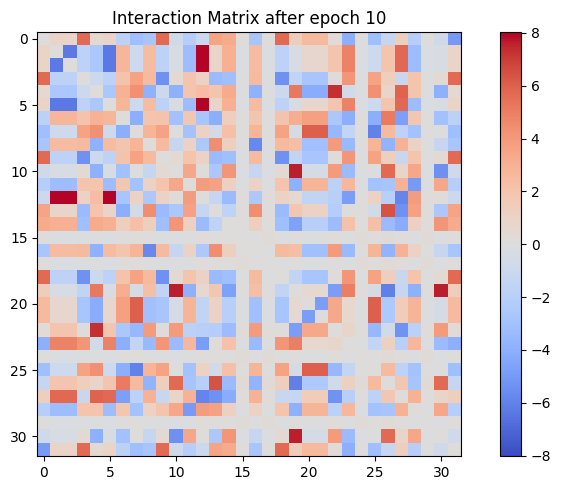

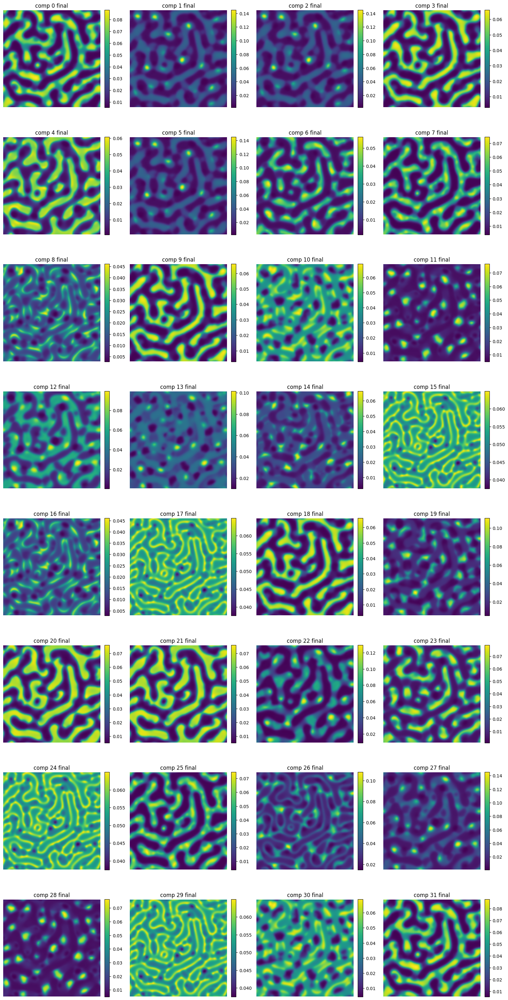

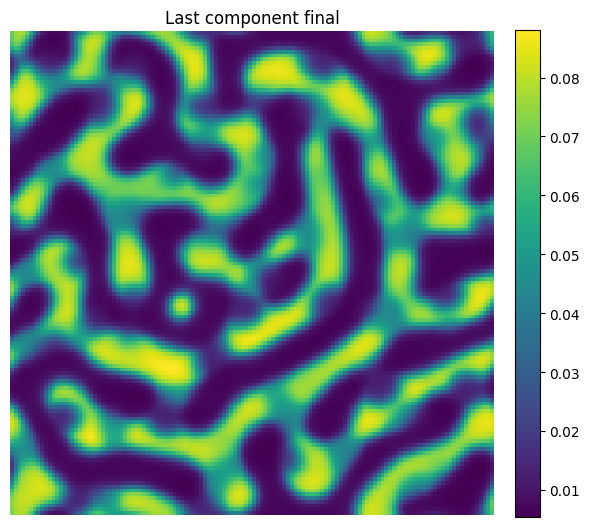

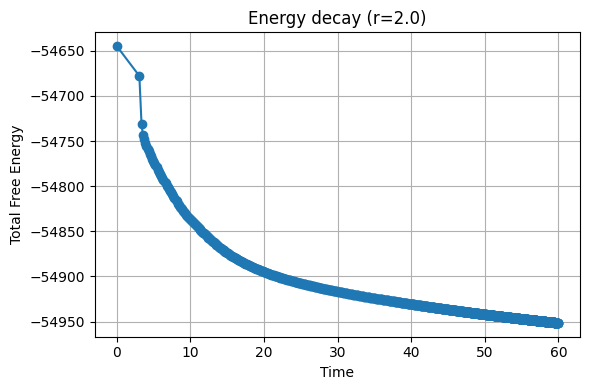

Training: 100%|██████████| 10/10 [2:26:11<00:00, 877.13s/it] 


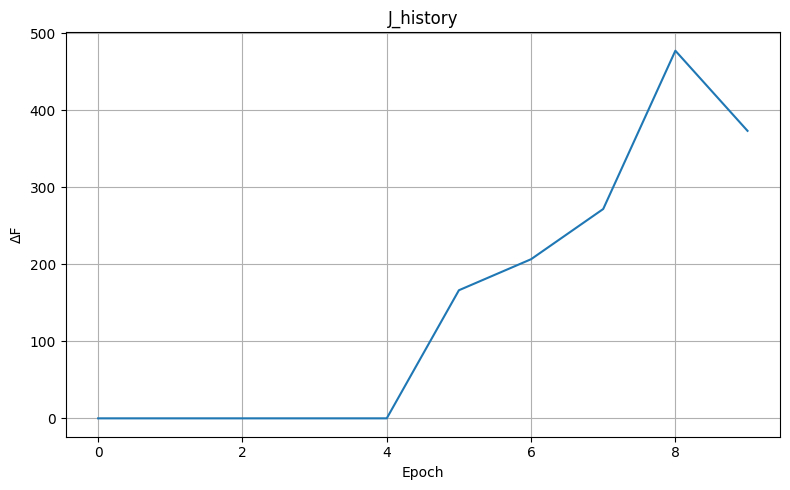

Trained chi matrix:


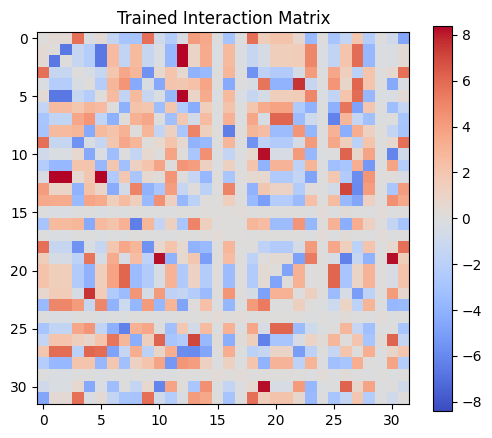

J_history (last 10): [np.float64(0.00015262021770467982), np.float64(0.00015157220332184806), np.float64(0.00014867225399939343), np.float64(0.00015115123096620664), np.float64(0.0001548790096421726), np.float64(166.34905460610025), np.float64(206.6365356084425), np.float64(271.8503485300462), np.float64(477.4077458704851), np.float64(373.3259247160022)]


In [21]:
# Train target memories (new cell)
epochs = 10
nc = 32
nx = ny = 128

chi_trained, J_history, phi_final_list = train_contrastive_hebbian_newscheme(
    training_memories=jnp.array(partitioned_memories),
    chi_ref=chi_ref,  # Use the chi_ref computed from the circular initial conditions
    chi_init=None,
    phi_initial=None,  # Use the circular initial conditions
    Epochs=epochs,
    nc=nc,
    nx=nx,
    ny=ny,
    kappa_val=5.0,
    dt=1e-3,
    noise_amp=0.0001,
    save_interval=200,
    r_stab=2.0,
    chi_clip=25.0,
    lr=1.0,
    plot=True,
    seed=42,
    sigma_spatial=2.0,
    max_steps=200000,
    max_time=500.0,
    dt_min=1e-8,
    dt_max=0.10,
    window=5,
    min_steps_check=5,
    energy_slope_tol=1e-8,
    track_energy=True,
    plot_gap=10,
)

# Show results
print("Trained chi matrix:")
plt.figure(figsize=(6,5))
plt.imshow(chi_trained, cmap="coolwarm", interpolation="nearest", vmin=-np.max(np.abs(chi_trained)), vmax=np.max(np.abs(chi_trained)))
plt.colorbar()
plt.title("Trained Interaction Matrix")
plt.show()

print("J_history (last 10):", J_history[-10:])
# Save trained matrix
np.save("chi_trained.npy", chi_trained)

In [ ]:
# Continue training (adjust epochs/lr as needed)
epochs = 2

chi_trained, J_history, phi_final_list = train_contrastive_hebbian_newscheme(
    training_memories=jnp.array(partitioned_memories),
    chi_ref=chi_ref,
    chi_init=chi_trained,
    Epochs=epochs,
    nc=nc, nx=nx, ny=ny,
    kappa_val=5.0, dt=1e-3, noise_amp=0.0001,
    save_interval=200, r_stab=2.0, chi_clip=25.0,
    lr=0.2, plot=True, seed=42, sigma_spatial=2.0,
    max_steps=200000, max_time=500.0,
    dt_min=1e-8, dt_max=0.10,
    window=5, min_steps_check=5, energy_slope_tol=1e-8,
    track_energy=True, plot_gap=10,
)
np.save('chi_trained.npy', chi_trained)
print('J_history (last 5):', J_history[-5:])


(128, 128, 5)
(128, 128)
(5, 32)
Memory 1: [0.05518521 0.00960353 0.0096035  0.00815389 0.00973397 0.00960338
 0.04675229 0.05110047 0.01133065 0.00815393 0.0448297  0.01096496
 0.05360544 0.04889482 0.00989116 0.05502736 0.01133073 0.05502778
 0.00815372 0.01254761 0.01199499 0.01199499 0.05381419 0.05129042
 0.05502747 0.05110049 0.01682927 0.05244555 0.01096501 0.05502749
 0.0448299  0.05518611]
Memory 2: [0.04936452 0.0102908  0.01029074 0.0107507  0.04710568 0.01029058
 0.01152162 0.01041516 0.04900006 0.01075081 0.05275713 0.00644055
 0.05562805 0.01729396 0.0091823  0.0540392  0.04900055 0.05403963
 0.01075053 0.00876283 0.05499305 0.05499288 0.01118952 0.05085458
 0.05403932 0.01041512 0.04989834 0.01333935 0.00644052 0.05403936
 0.0527573  0.04936525]
Memory 3: [0.01133104 0.04904505 0.04904473 0.05302775 0.04760638 0.04904424
 0.00593801 0.00820216 0.00939095 0.05302817 0.04679024 0.00884619
 0.01404955 0.0479498  0.01290295 0.05667659 0.00939104 0.05667705
 0.05302707 0.0141

/tmp/ipykernel_2603/3410880525.py:628: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_colors = plt.cm.get_cmap('tab20', K)  # 'tab20' has distinct colors
/tmp/ipykernel_2603/3410880525.py:564: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1]) # Adjust layout to make space for colorbar


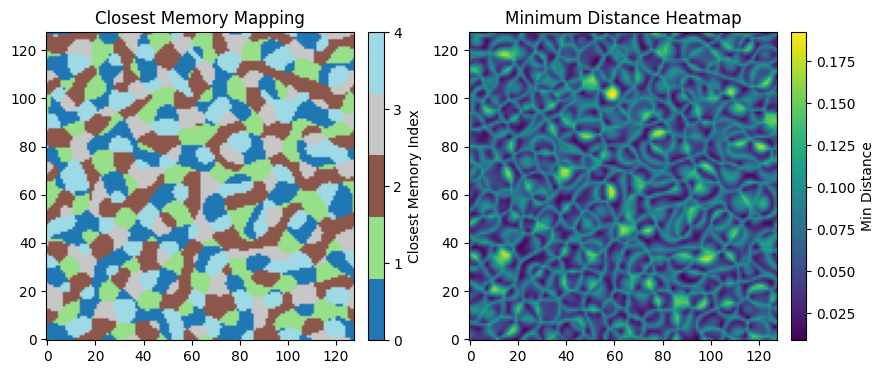

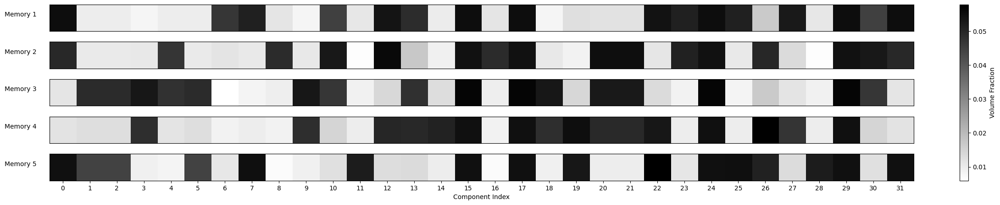

(array([[0.05518521, 0.00960353, 0.0096035 , 0.00815389, 0.00973397,
         0.00960338, 0.04675229, 0.05110047, 0.01133065, 0.00815393,
         0.0448297 , 0.01096496, 0.05360544, 0.04889482, 0.00989116,
         0.05502736, 0.01133073, 0.05502778, 0.00815372, 0.01254761,
         0.01199499, 0.01199499, 0.05381419, 0.05129042, 0.05502747,
         0.05110049, 0.01682927, 0.05244555, 0.01096501, 0.05502749,
         0.0448299 , 0.05518611],
        [0.04936452, 0.0102908 , 0.01029074, 0.0107507 , 0.04710568,
         0.01029058, 0.01152162, 0.01041516, 0.04900006, 0.01075081,
         0.05275713, 0.00644055, 0.05562805, 0.01729396, 0.0091823 ,
         0.0540392 , 0.04900055, 0.05403963, 0.01075053, 0.00876283,
         0.05499305, 0.05499288, 0.01118952, 0.05085458, 0.05403932,
         0.01041512, 0.04989834, 0.01333935, 0.00644052, 0.05403936,
         0.0527573 , 0.04936525],
        [0.01133104, 0.04904505, 0.04904473, 0.05302775, 0.04760638,
         0.04904424, 0.00593801, 0.

In [29]:
identify_memories(phi_final_list[-1].transpose(1,2,0), partitioned_memories)

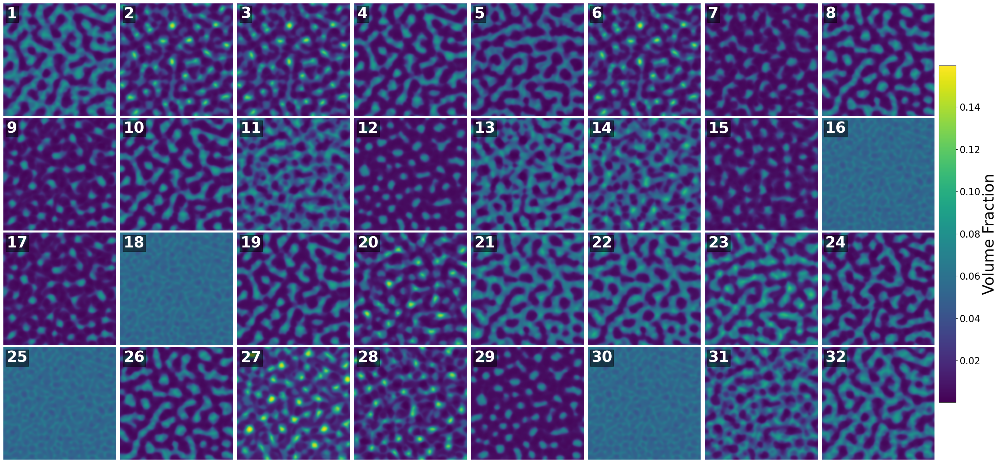

In [46]:
final_frame = phi_final_list[-1]

n_show = min(nc, final_frame.shape[0])
ncols = 8
nrows = int(np.ceil(n_show / ncols))

vmin = np.min(final_frame[:n_show])
vmax = np.max(final_frame[:n_show])

TITLE_SIZE = 24
CBAR_LABEL_SIZE = 32
CBAR_TICK_SIZE = 20

fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(4 * ncols, 3.5 * nrows)
)
axes = np.atleast_1d(axes).ravel()

for idx in range(n_show):
    im = axes[idx].imshow(
        final_frame[idx],
        origin="lower",
        vmin=vmin,
        vmax=vmax
    )
    axes[idx].text(
    0.03, 0.97,
    f"{idx+1}",
    transform=axes[idx].transAxes,
    fontsize=32,
    fontweight="bold",
    color="white",
    ha="left",
    va="top",
    bbox=dict(facecolor="black", alpha=0.5, pad=2)
)
    axes[idx].axis("off")

for ax in axes[n_show:]:
    ax.axis("off")

# Shared colorbar
cbar = fig.colorbar(
    im,
    ax=axes[:n_show],
    fraction=0.02,
    pad=0.02
)

cbar.set_label(
    "Volume Fraction",
    fontsize=CBAR_LABEL_SIZE
)

cbar.ax.tick_params(
    labelsize=CBAR_TICK_SIZE
)

fig.subplots_adjust(
    left=0.02,
    right=0.88,   # leave room for colorbar
    bottom=0.02,
    top=0.98,
    wspace=0.01,
    hspace=0.02
)

plt.show()

# Running more with the trained matrix

time=0.064867, step=1000, dt=7.796e-05, rel_change=1.517e-01, min_raw=2.864e-04, raw_mass_err=4.441e-16, mean=[0.0360099  0.02649031 0.02649016 0.02649028 0.02649019 0.0264899
 0.01697029 0.02648992 0.01696989 0.02649048 0.03600982 0.01696968
 0.03601035 0.0360102  0.01697028 0.05504957 0.01697007 0.05505003
 0.0264899  0.02648986 0.03600993 0.03600985 0.03601001 0.02649005
 0.05504968 0.0264899  0.03600979 0.02648987 0.01696969 0.05504973
 0.03600998 0.03601047], var=[0.0005961296644131681, 0.0005860701502824095, 0.0005860628232832479, 0.0005760347563339673, 0.00044632230014289516, 0.000586056721594065, 0.00030923258906495285, 0.0005750164215560991, 0.000332476590228403, 0.0005760430480192256, 0.0004813326634866731, 0.00034911580841742273, 0.0005313012123909541, 0.0005275626418132276, 0.00029095603581681884, 2.0865318342700377e-05, 0.00033248381374131354, 2.0865418542524326e-05, 0.0005760211896046984, 0.0006321930123029112, 0.0005820286202653995, 0.0005820249817136262, 0.0006861175043

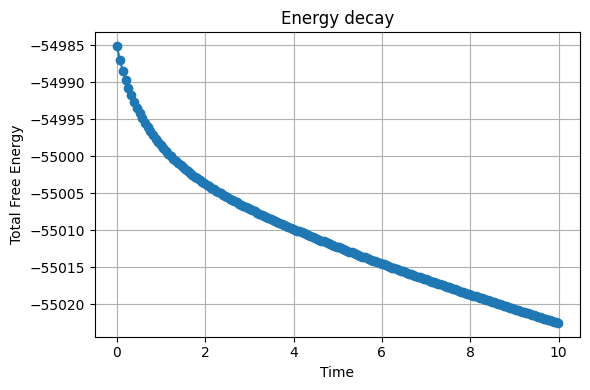

(128, 128, 5)
(128, 128)
(5, 32)
Memory 1: [0.05435591 0.01033728 0.01033724 0.00842832 0.01174358 0.0103371
 0.04855924 0.04969098 0.01122105 0.00842837 0.05056058 0.00944894
 0.05102405 0.05030981 0.00818308 0.05565225 0.01122113 0.05565265
 0.00842814 0.01060428 0.01219383 0.01219383 0.05009923 0.05138061
 0.05565235 0.04969099 0.015586   0.0486602  0.00944899 0.05565237
 0.05056081 0.05435677]
Memory 2: [0.04967601 0.01062952 0.01062946 0.01015543 0.05475825 0.0106293
 0.01252424 0.01031667 0.04756944 0.01015553 0.06058924 0.00538335
 0.0513734  0.01729466 0.00672043 0.05388289 0.0475699  0.0538833
 0.01015527 0.00671081 0.05375534 0.05375519 0.00972493 0.05236034
 0.053883   0.01031664 0.04452568 0.01153921 0.00538332 0.05388304
 0.06058944 0.04967676]
Memory 3: [0.01348441 0.04537069 0.04537041 0.04868826 0.0469786  0.04536993
 0.00661429 0.00940929 0.0102493  0.0486887  0.04504344 0.00915693
 0.01653502 0.04526313 0.01249553 0.05878417 0.01024939 0.05878464
 0.0486877  0.0156682

/tmp/ipykernel_2603/3017227307.py:628: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_colors = plt.cm.get_cmap('tab20', K)  # 'tab20' has distinct colors
/tmp/ipykernel_2603/3017227307.py:564: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.95, 1]) # Adjust layout to make space for colorbar


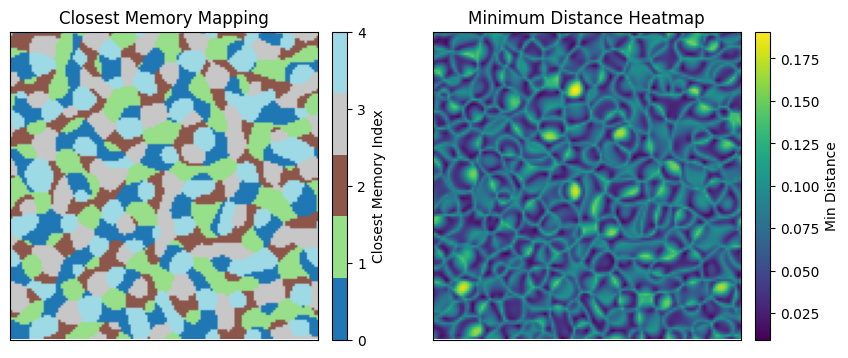

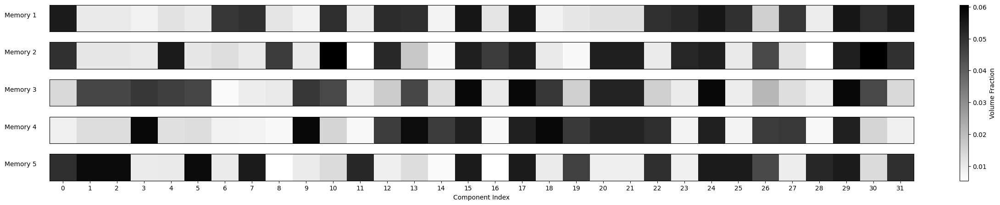

(array([[0.05435591, 0.01033728, 0.01033724, 0.00842832, 0.01174358,
         0.0103371 , 0.04855924, 0.04969098, 0.01122105, 0.00842837,
         0.05056058, 0.00944894, 0.05102405, 0.05030981, 0.00818308,
         0.05565225, 0.01122113, 0.05565265, 0.00842814, 0.01060428,
         0.01219383, 0.01219383, 0.05009923, 0.05138061, 0.05565235,
         0.04969099, 0.015586  , 0.0486602 , 0.00944899, 0.05565237,
         0.05056081, 0.05435677],
        [0.04967601, 0.01062952, 0.01062946, 0.01015543, 0.05475825,
         0.0106293 , 0.01252424, 0.01031667, 0.04756944, 0.01015553,
         0.06058924, 0.00538335, 0.0513734 , 0.01729466, 0.00672043,
         0.05388289, 0.0475699 , 0.0538833 , 0.01015527, 0.00671081,
         0.05375534, 0.05375519, 0.00972493, 0.05236034, 0.053883  ,
         0.01031664, 0.04452568, 0.01153921, 0.00538332, 0.05388304,
         0.06058944, 0.04967676],
        [0.01348441, 0.04537069, 0.04537041, 0.04868826, 0.0469786 ,
         0.04536993, 0.00661429, 0.

In [45]:
frames,phi,mean_phi_global,energies,steps_saved,time_saved = run_cahn_hilliard_multi_FH_rstab_jax_until_converged(
    nc=32,
    nx=128,
    ny=128,
    dx=1.0,
    dy=1.0,
    M=jnp.ones(shape=nc),
    kappa=5.0*jnp.ones(shape=nc),
    chi=chi_trained,
    nu=None,
    dt=1e-3,
    mean_phi=None,
    initial_phi=phi_final_list[-1],
    noise_amp=0.02,
    save_interval=1000,
    seed=None,
    verbose=True,
    track_energy=True,
    training=False,
    r_stab=None,
    max_steps=200000,
    max_time=500.0,
    dt_min=1e-8,
    dt_max=0.1,
    energy_increase_tol=1e-6,
    mean_tol=1e-5,
    raw_mass_tol=1e-5,
    raw_min_tol=-1e-6,
    field_tol=1e-6,
    energy_slope_tol=1e-8,
    window=5,
    min_steps_check=5,
    grow_dt=1.05,
    sigma_spatial=2.0,
)
plot_energy(time_saved, energies, title=f"Energy decay")
identify_memories(frames[-1].transpose(1,2,0), partitioned_memories)